In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from collections import Counter

In [7]:
df = pd.read_csv("all/training_set.csv")
df_meta = pd.read_csv("all/training_set_metadata.csv").set_index("object_id")
df_meta

,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,target
object_id,,,,,,,,,,,
615,349.046051,-61.943836,320.796530,-51.753706,1,0.0000,0.0000,0.0000,NaN,0.017,92
713,53.085938,-27.784405,223.525509,-54.460748,1,1.8181,1.6267,0.2552,45.4063,0.007,88
730,33.574219,-6.579593,170.455585,-61.548219,1,0.2320,0.2262,0.0157,40.2561,0.021,42
745,0.189873,-45.586655,328.254458,-68.969298,1,0.3037,0.2813,1.1523,40.7951,0.007,90
1124,352.711273,-63.823658,316.922299,-51.059403,1,0.1934,0.2415,0.0176,40.4166,0.024,90
1227,35.683594,-5.379379,171.992947,-59.253501,1,0.0000,0.0000,0.0000,NaN,0.020,65
1598,347.846710,-64.760857,318.929827,-49.143596,1,0.1352,0.1820,0.0304,39.7279,0.019,90
1632,348.595886,-63.072620,320.023289,-50.713060,1,0.6857,0.7014,0.0100,43.1524,0.021,42
1920,149.414062,3.433834,234.919132,42.245550,1,0.3088,0.3229,0.3360,41.1401,0.027,90


In [235]:
flux = np.array(df["flux"])
flux[flux<0] = np.random.rand()
df["flux"] = flux

In [236]:
df_test_meta = pd.read_csv("all/test_set_metadata.csv")

In [428]:
plt.style.use('ggplot')

## Classify between intragalactic and extragalactic and calculate weights

Intragalactic objects have a distmod of 0 while the extragalactic have a distinct decimal number

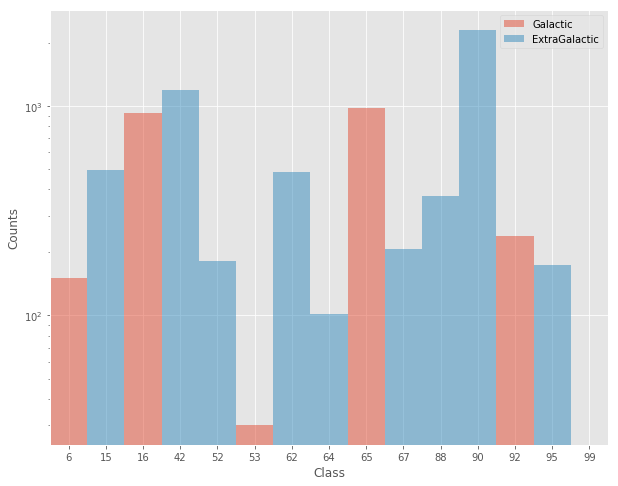

In [23]:
galactic_data = df_meta[df_meta["hostgal_specz"] == 0.0]
galactic_data.head()

extragalactic_data = df_meta[df_meta["hostgal_specz"] > 0.0]

targets = np.hstack([np.unique(df_meta['target']), [99]])
target_map = {j:i for i, j in enumerate(targets)}
target_ids = [target_map[i] for i in df_meta['target']]
df_meta['target_id'] = target_ids

plt.figure(figsize=(10, 8))
plt.hist(galactic_data['target_id'], 15, (0, 15), alpha=0.5, label='Galactic')
plt.hist(extragalactic_data['target_id'], 15, (0, 15), alpha=0.5, label='ExtraGalactic')

plt.xticks(np.arange(15)+0.5, targets)
plt.gca().set_yscale("log")
plt.xlabel('Class')
plt.ylabel('Counts')
plt.xlim(0, 15)
plt.legend()

In [24]:
class_weights = {6: 1, 15: 2, 16: 1, 42: 1, 52: 1, 53: 1, 62: 1, 64: 2, 65: 1, 67: 1, 88: 1, 90: 1, 92: 1, 95: 1}
#Taken from Siddhartha's Simple Neural Net for Time Series Classification
#https://www.kaggle.com/meaninglesslives/simple-neural-net-for-time-series-classification?fbclid=IwAR1UJHWeMYPjHVw4E-3HxR7gip-cSQNcyq1q1VadOATDee-Se3MpnUD8o2E

## Scatterplot of flux

Plot all the objects of each class to see if we can get anything from the data, turns out that there are some similarities in the macroscopic view, as most objects of the same target follow more or less the same pattern. This means that the details of an object's flux that can be obtained from it's timeseries will be of great importance on deciding which object belongs to which class.

<function matplotlib.pyplot.show>

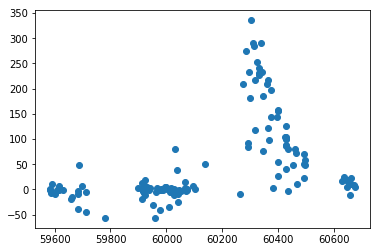

In [8]:
from matplotlib import cm
import matplotlib.patches as mpatches

trgts = np.array(pd.merge(df[['object_id']], df_meta[['target']], on = 'object_id', how = 'outer'))[:,[1]]

df["target"] = trgts
fig = plt.figure(figsize = (40,40))
class_ids = df["target"]
class_ids = np.array(class_ids)
class_flux = df[df["target"].isin(class_ids)]
class_flux = class_flux[class_flux["flux"]>=0]

object_ids = class_flux["target"].unique()

colors = cm.rainbow(np.linspace(0, 1, 6))
patches = [mpatches.Patch(color= colors[0], label='0'),
           mpatches.Patch(color=colors[1], label='1'),
           mpatches.Patch(color=colors[2], label='2'),
           mpatches.Patch(color=colors[3], label='3'),
           mpatches.Patch(color=colors[4], label='4'),
           mpatches.Patch(color=colors[5], label='5')]

for i,object in enumerate(object_ids):
    i+=1
    if(i==14):
        break
    cf = class_flux[class_flux["target"]==object]
    axs = fig.add_subplot(7, 2, i)
    axs.scatter(cf["mjd"], cf["flux"],c = cf.passband, cmap=matplotlib.colors.ListedColormap(colors))
    axs.legend(handles = patches)
plt.show()


## Flux timeseries
### 20 objects for each target

After running the code below we get 20 graphs for each one of the target classes from which we can derive that most same-class objects follow similar patterns from a microscopic point of view.

In [26]:
def plot_class_flux(df, t):
    

    fig = plt.figure(figsize = (50,150))
    class_ids = df["object_id"]
    class_ids = np.array(class_ids)
    class_flux = df[df["object_id"].isin(class_ids)]
    class_flux = class_flux[((class_flux["flux"]/class_flux["flux_err"])>1.5) & (class_flux["flux"]>=0)]
    
    class_flux = class_flux[class_flux.target == t]
    object_ids = class_flux["object_id"].unique()

    
    colors = cm.rainbow(np.linspace(0, 1, 6))
    patches = [mpatches.Patch(color= colors[0], label='0'),
           mpatches.Patch(color=colors[1], label='1'),
           mpatches.Patch(color=colors[2], label='2'),
           mpatches.Patch(color=colors[3], label='3'),
           mpatches.Patch(color=colors[4], label='4'),
           mpatches.Patch(color=colors[5], label='5')]
    
    for i, object in enumerate(object_ids):
        i+=1
        if(i==20):
            break
        cf = class_flux[class_flux["object_id"]==object]
        axs = fig.add_subplot(20, 1, i)
        axs.scatter(cf["mjd"], cf["flux"], c = cf.passband, cmap=matplotlib.colors.ListedColormap(colors))
        axs.legend(handles = patches)
    plt.show()

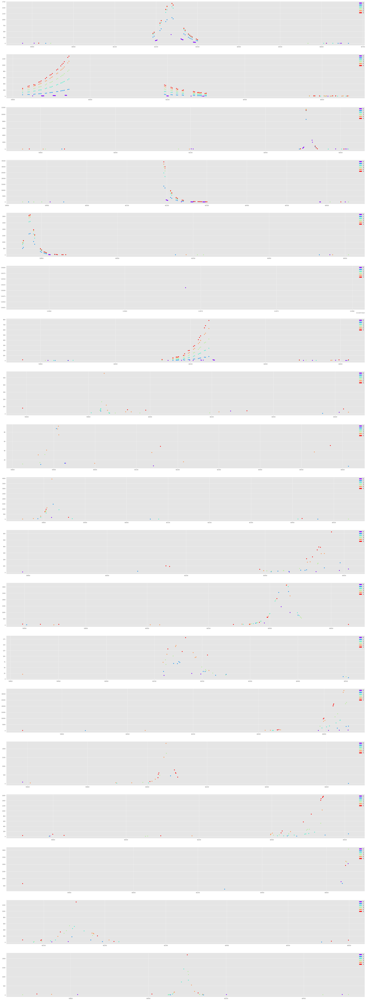

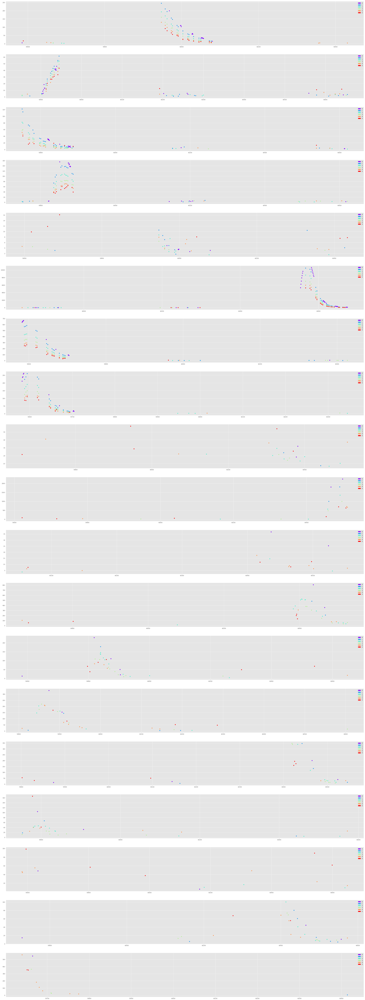

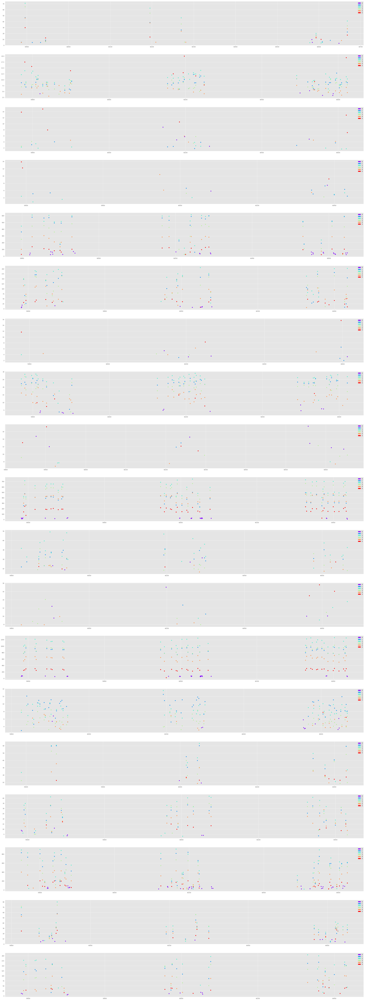

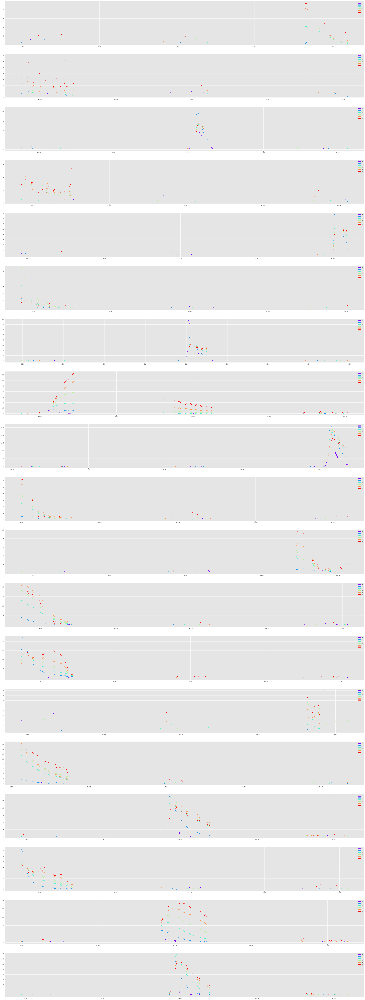

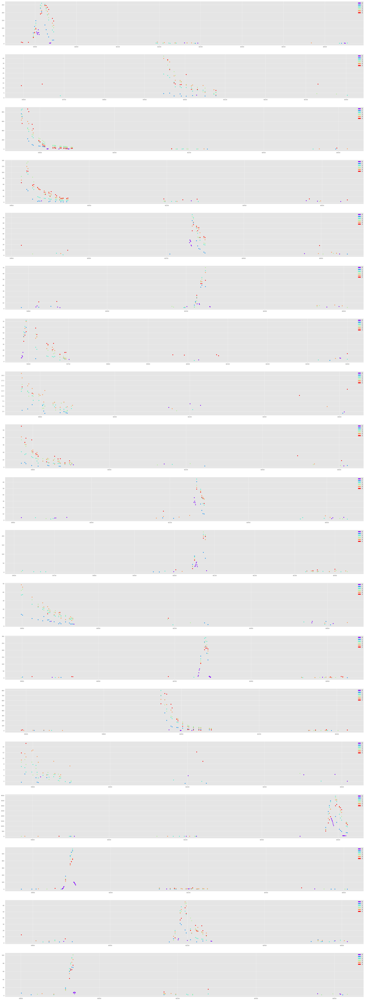

...

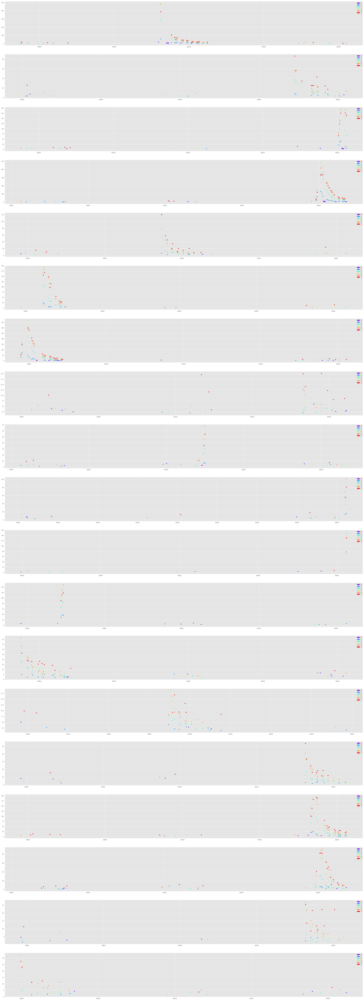

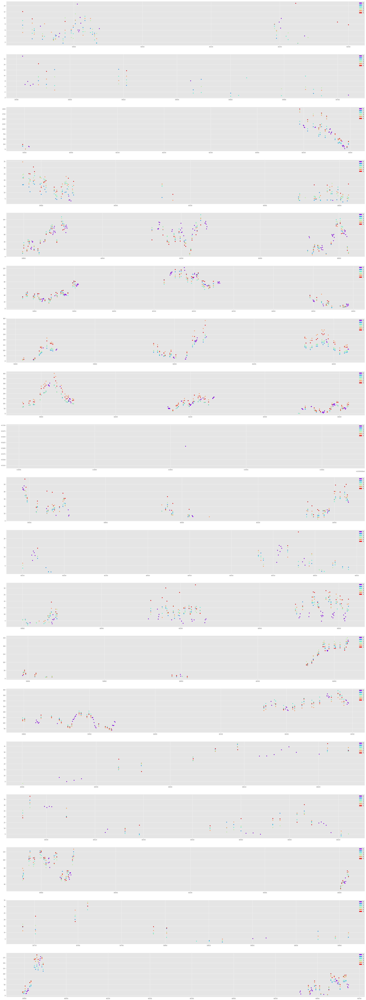

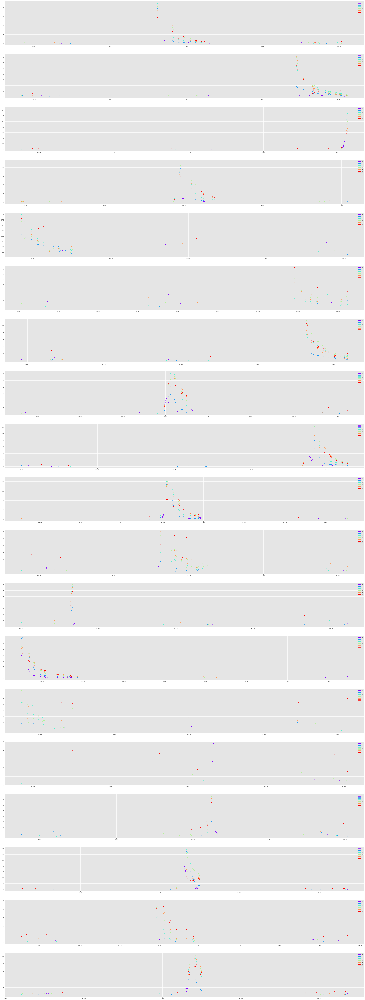

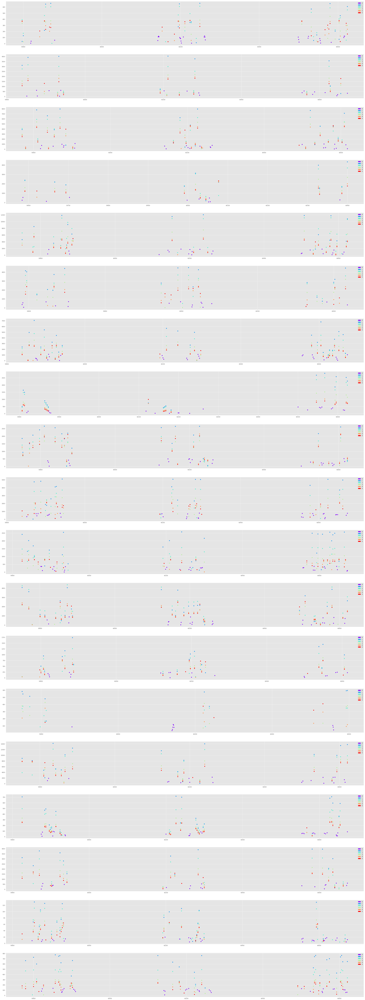

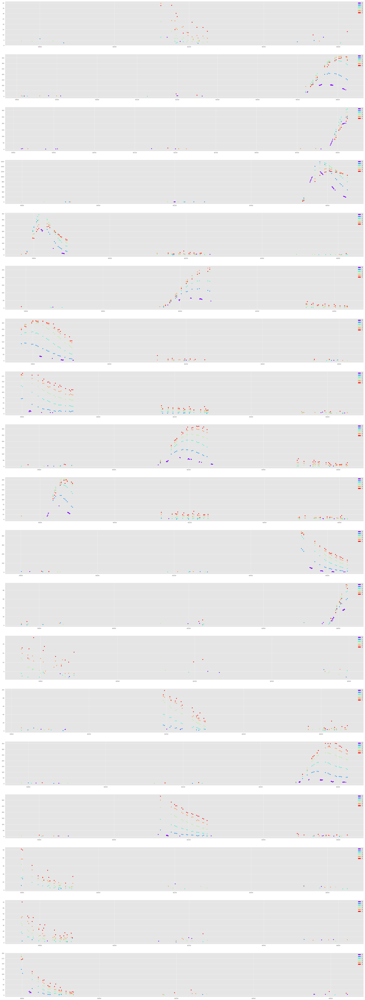

In [27]:
targets = np.unique(class_ids)
for t in targets:
    plot_class_flux(df,t)

## Scatterplot of coordinates

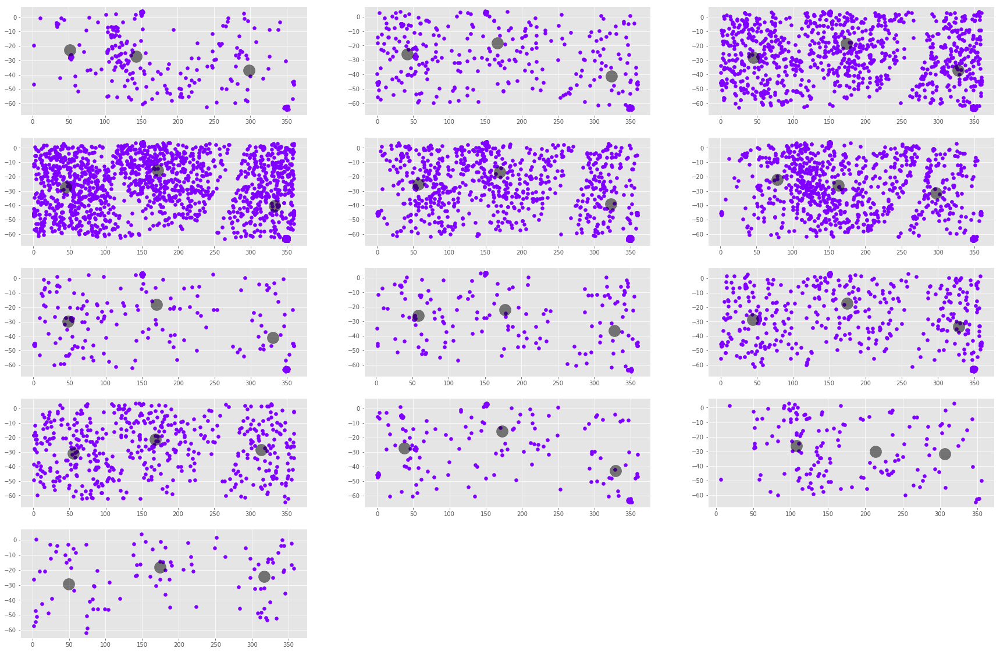

In [15]:
# We will be plotting each point in space of a certain class to see how each  point is mapped

fig = plt.figure(figsize = (30,20))
class_ids = df_meta["target"]
class_ids = np.array(class_ids)
class_flux = df_meta[df_meta["target"].isin(class_ids)]
from sklearn.cluster import KMeans
colors = cm.rainbow(np.linspace(0, 1, len(object_ids)))

object_ids = class_flux["target"].unique()
for i,object in enumerate(object_ids):
    i+=1
    if(i==14):
        break
    
    cf = class_flux[class_flux["target"]==object]
    estimator = KMeans(n_clusters=3)
    estimator.fit(np.array(cf[["ra","decl"]]))
    axs = fig.add_subplot(5, 3, i)
    axs.scatter(cf["ra"], cf["decl"],c=colors[i])
    centers = estimator.cluster_centers_
    axs.scatter(centers[:, 0], centers[:, 1], c='black', s=400, alpha=0.5);


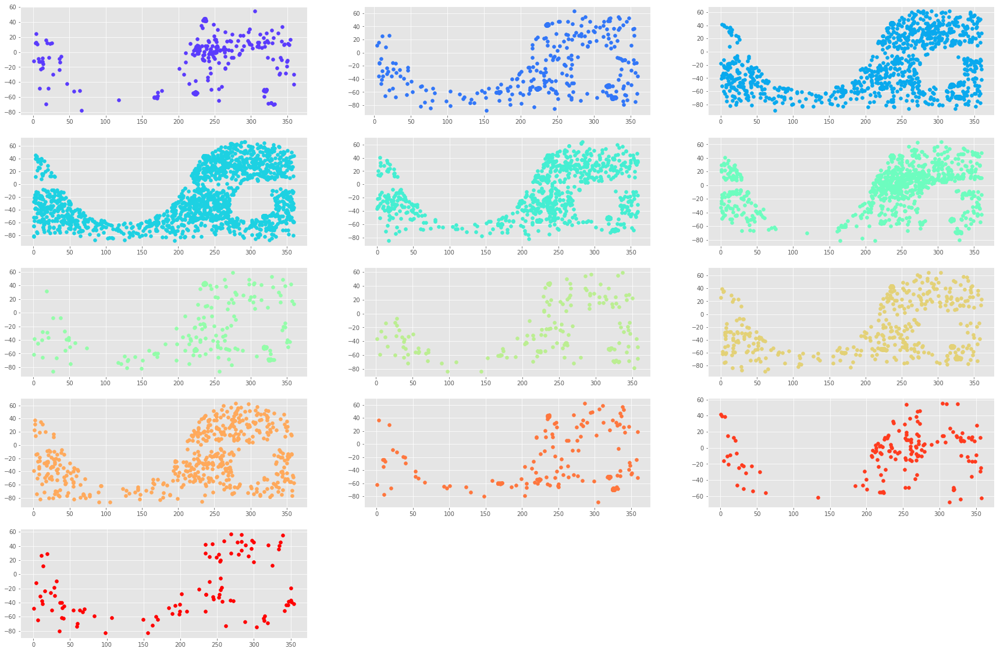

In [16]:
# Same for galactic coordinates
# We will be plotting each point in space of a certain class to see how each  point is mapped

fig = plt.figure(figsize = (30,20))
class_ids = df_meta["target"]
class_ids = np.array(class_ids)
class_flux = df_meta[df_meta["target"].isin(class_ids)]

object_ids = class_flux["target"].unique()
colors = cm.rainbow(np.linspace(0, 1, len(object_ids)))

for i,object in enumerate(object_ids):
    i+=1
    if(i==14):
        break
    cf = class_flux[class_flux["target"]==object]
    axs = fig.add_subplot(5, 3, i)
    axs.scatter(cf["gal_l"], cf["gal_b"],c=colors[i])
    


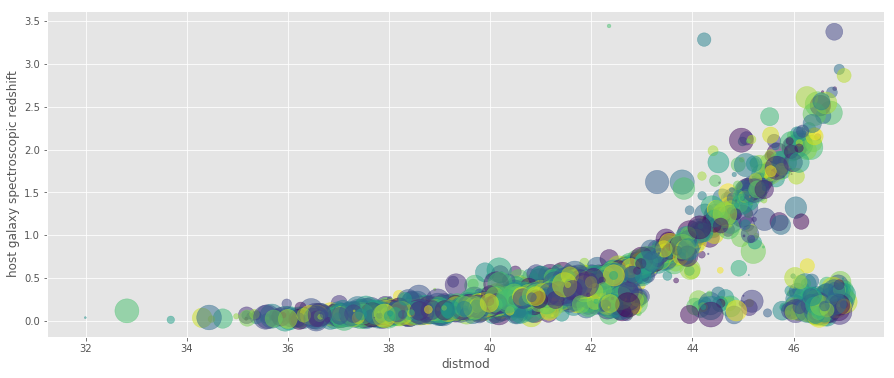

In [18]:
# Plot distance against redshift, see they are correlated greatly

colors = np.random.rand(df_meta.shape[0])
area = (25 * np.random.rand(df_meta.shape[0]))**2
        
plt.subplots(figsize=(15,6))
plt.scatter(df_meta.distmod, df_meta.hostgal_specz, s = area, c = colors, alpha = 0.5)
plt.xlabel("distmod")
plt.ylabel("host galaxy spectroscopic redshift")
plt.show()

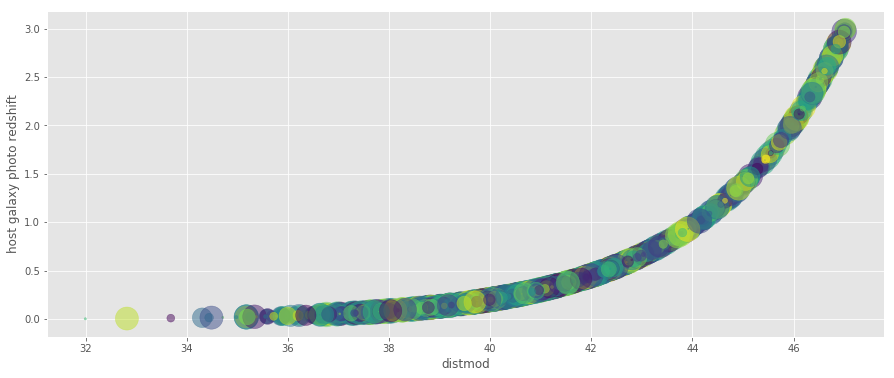

In [28]:
# Plot distance against redshift, see they are correlated greatly

colors = np.random.rand(df_meta.shape[0])
area = (25 * np.random.rand(df_meta.shape[0]))**2
        
plt.subplots(figsize=(15,6))
plt.scatter( df_meta.distmod,df_meta.hostgal_photoz, s = area, c = colors, alpha = 0.5)
plt.xlabel("distmod")
plt.ylabel("host galaxy photo redshift")
plt.show()

# We have to correct for the error

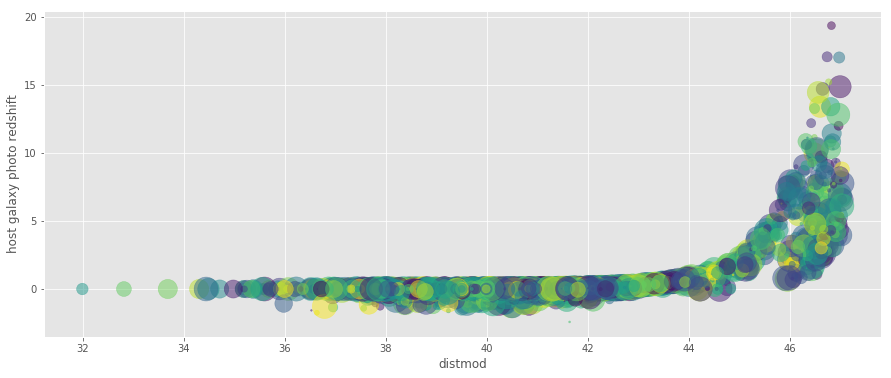

In [18]:
colors = np.random.rand(df_meta.shape[0])
area = (25 * np.random.rand(df_meta.shape[0]))**2
        
plt.subplots(figsize=(15,6))
plt.scatter( df_meta.distmod,(df_meta.hostgal_photoz-df_meta.hostgal_photoz_err)**3, s = area, c = colors, alpha = 0.5)
plt.xlabel("distmod")
plt.ylabel("host galaxy photo redshift")
plt.show()

# We have to correct for the error

#Maybe handle like this the error (real-error)**2 ?! we'll have to try and find out

In [27]:
df_test_meta = pd.read_csv("all/test_set_metadata.csv")
df_test_meta["hostgal_specz"].fillna((df_test_meta["hostgal_photoz"]-df_test_meta["hostgal_photoz_err"])**2, inplace=True)

df_test_meta.head()


,object_id,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv
0,13,34.453125,-5.229529,169.987075,-59.956185,1,0.304800,0.3193,0.0542,41.1123,0.019
1,14,33.398438,-4.331149,167.226341,-59.936551,1,0.377487,0.6323,0.0179,42.8774,0.018
2,17,348.529419,-61.755440,321.293980,-51.763351,1,0.591669,0.8297,0.0605,43.6000,0.016
3,23,34.804688,-5.829153,171.307861,-60.174401,1,0.255429,0.6533,0.1479,42.9640,0.023
4,34,351.321442,-64.198746,317.458993,-50.429931,1,0.455700,0.4617,0.0122,42.0540,0.023


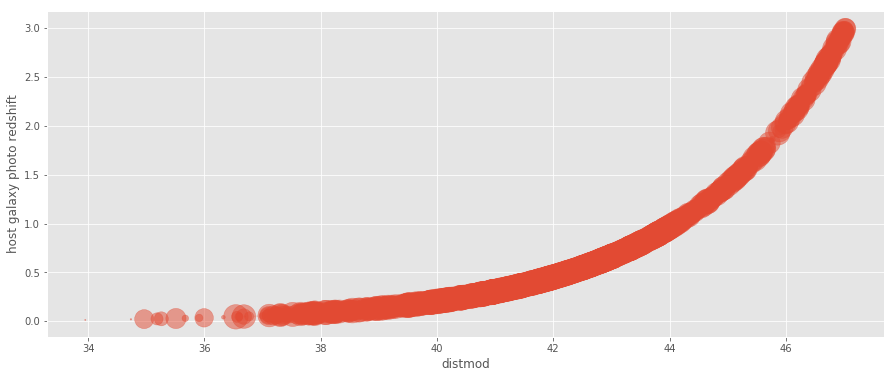

In [29]:
colors = np.random.rand(df_meta.shape[0])
area = (25 * np.random.rand(df_meta.shape[0]))**2
        
plt.subplots(figsize=(15,6))
plt.scatter( df_test_meta.distmod,df_test_meta.hostgal_photoz, s = area, alpha = 0.5)
plt.xlabel("distmod")
plt.ylabel("host galaxy photo redshift")
plt.show()

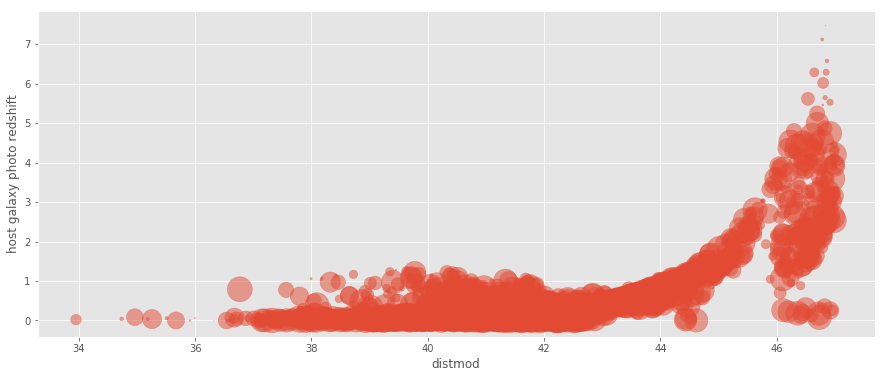

In [28]:
colors = np.random.rand(df_meta.shape[0])
area = (25 * np.random.rand(df_meta.shape[0]))**2

df_test_meta = df_test_meta.sample(10000)
plt.subplots(figsize=(15,6))
plt.scatter( df_test_meta.distmod,df_test_meta.hostgal_specz, s = area, alpha = 0.5)
plt.xlabel("distmod")
plt.ylabel("host galaxy photo redshift")
plt.show()


## First Conclusions

What we derive from the above is the following

1) The flux can really tell the classes apart as we can classify them with our knowledge of physics by the graphs<br>
2) The coordinates aren't that useful as most of the objects exist in the same space<br>
3) Distance and redshift can be shortened to one number like **x = distmod (times) redshift **<br>
4) Classes have to be weighted or normalized by size as they don't have similar sizes<br>
5) It would be better if we did the analysis based on each passband rather than the whole data of an object